In [1]:
import numpy as np
import matplotlib.pyplot as plt
from typing import Callable, List
from itertools import product
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import HTML
import seaborn as sns
from IPython.display import Video
import os
import pandas as pd
import torch
import torchvision
import torchvision.transforms as transforms
import torch.nn as nn
from torch.utils.data import Dataset
from torch import Tensor
from abc import ABC, abstractmethod
from torch.nn.functional import relu
from torch.utils.data.dataloader import DataLoader
from tqdm.notebook import tqdm
import scipy.stats as st

In [2]:
class ItoSDE(ABC):
    def __init__(self, T_max: float):
        self.T_max = T_max
    
    @abstractmethod
    def cond_exp(self, X_0: Tensor, t: Tensor):
        pass
        
    @abstractmethod
    def cond_var(self, X_0: Tensor, t: Tensor):
        pass
       
    @abstractmethod
    def f_drift(self, X_t: Tensor, t: Tensor):
        pass
        
    @abstractmethod
    def g_random(self, X_t: Tensor, t: Tensor):
        pass

    def cond_std(self, X_0: Tensor, t: Tensor):
        """Conditional standard deviation. Square root of self.cond_var."""
        return torch.sqrt(self.cond_var(X_0=X_0,t=t))
                   
    def sample_random_times(self, length: int):
        """Sample 'length' time points uniformly in interval [0,T]"""
        return torch.rand(size=(length,))*self.T_max
    
    @staticmethod
    def _mult_first_dim(t,X):
        """ 
        Helper function to multiply one-dimensional time vector with tensor of
        arbitrary shape.
        Inputs:
            X_0: shape (n,*,*,...,*)
            t: shape (n)
        Outputs:
            has same shape as X_0 - inputs X_0[i] multipled with t[i]
        """
        return t.view(-1,*[1]*(X.dim()-1))*X
        
    def run_forward(self, X_0: Tensor, t: Tensor, clip_factor: float = 0.01):
        """
        Function to evolve SDE forward in time from 0 to t<=self.T_max.
        Assume that conditional distribution is Gaussian
        Inputs:
            X_0: shape (n,*,*,...,*)
            t: shape (n)
        Outputs:
            X_t: shape as X_0 - noised input
            noise: shape as X_0 - noise converting X_0 to X_t
            score: shape as X_0 - score of conditional distribution q_t|0(X_t|X_0)
        """
        noise = torch.randn(size=X_0.shape)
        cond_std = self.cond_std(X_0,t)
        cond_exp = self.cond_exp(X_0,t)
        X_t = self._mult_first_dim(cond_std,noise)+cond_exp
        if clip_factor is not None:
            cond_std = torch.clip(cond_std,min=clip_factor)
        score = -self._mult_first_dim(1/cond_std,noise)

        return X_t, noise, score
        
    def run_forward_random_times(self, X_0: Tensor):
        """Function to evolve SDE forward until random times."""
        t = self.sample_random_times(X_0.shape[0])
        X_t, noise, score = self.run_forward(X_0,t)
        return X_t, noise, score, t

In [3]:
class VPSDE(ItoSDE):
    def __init__(self,T_max: float, beta_min: float = 0.0, beta_max: float = 1.0):
       self.T_max = T_max
       self.beta_min = beta_min
       self.beta_max = beta_max
        
    def _beta_derivative(self, t: Tensor):
        return self.beta_min+(self.beta_max - self.beta_min)*t
        
    def _beta(self, t: Tensor):
        return (self.beta_min*t)+0.5*(self.beta_max - self.beta_min)*(t**2)

    def cond_exp(self, X_0: Tensor, t: Tensor):
        """ 
        Inputs:
            X_0: shape (n,*,*,...,*)
            t: shape (n)
        Outputs:

        """
        assert len(t.shape) == 1, "Time must be 1-dimensional."
        assert t.shape[0] == X_0.shape[0]
        beta_t = self._beta(t)
        cond_exp_t = torch.exp(-0.5*beta_t)
        return self._mult_first_dim(cond_exp_t,X_0)

    def cond_var(self, X_0: Tensor, t: Tensor):
        """ 
        Inputs:
            X_0: shape (n,*,*,...,*)
            t: shape (n)
        Outputs:

        """
        assert len(t.shape) == 1, "Time must be 1-dimensional."
        #assert t.shape[0] == X_0.shape[0]
        beta_t = self._beta(t)
        cond_var_t = 1-torch.exp(-beta_t)
        return cond_var_t

    
    def f_drift(self, X_t: Tensor, t: Tensor):
        """ 
        Inputs:
            X_0: shape (n,*,*,...,*)
            t: shape (n)
        Outputs:

        """
        assert len(t.shape) == 1, "Time must be 1-dimensional."
        assert t.shape[0] == X_t.shape[0]
        deriv_beta_t = self._beta_derivative(t)
        return -0.5*self._mult_first_dim(deriv_beta_t,X_t)
        
    def g_random(self, t: Tensor):
        """ 
        Inputs:
            X_0: shape (n,*,*,...,*)
            t: shape (n)
        Outputs:

        """
        assert len(t.shape) == 1, "Time must be 1-dimensional."
        deriv_beta_t = self._beta_derivative(t)
        return torch.sqrt(deriv_beta_t)

In [20]:
def train_diffusion_model(model, sde: ItoSDE, dataloader: DataLoader, scheduler,optimizer, device, n_epochs: int, print_every: int, train_score: bool = TRAIN_SCORE):
    model.train()
    model = model.to(device)
    loss_function = nn.MSELoss(reduction='mean')
    running_loss_list = []
    
    for epoch in range(n_epochs):
        print(f"Epoch: {epoch}")
        running_loss = 0.0
        for idx, (x_inp, _) in enumerate(dataloader):
            
            #Zero gradients:
            optimizer.zero_grad()
            
            #Run forward samples:
            X_t,noise,score,time = sde.run_forward_random_times(x_inp)

            #Send to device:
            X_t = X_t.to(device)
            noise = noise.to(device)
            time = time.to(device)
            
            #Predict score:
            model_pred = model(X_t,time)

            #Compute loss:
            if train_score:
                loss = loss_function(score,model_pred)
            else:
                loss = loss_function(noise,model_pred)

            #Optimize:
            loss.backward()
            optimizer.step()
            scheduler.step()

            # print statistics
            running_loss += loss.detach().item()
            
            if (idx+1) % print_every == 0:
                avg_loss = running_loss/print_every
                running_loss_list.append(avg_loss)
                running_loss = 0.0
                print(avg_loss)
    return model,running_loss_list

In [30]:
def run_backwards(model: torch.nn.Module, sde: ItoSDE, x_start: Tensor, device, train_score, n_steps: int = 10, plot_evolution: bool = True, clip_max: float = 1.0, clip_min: float = -1.0, **kwargs):
    """Function to run stochastic differential equation. We assume a deterministic initial distribution p_0."""
    model = model.to(device)
    
    #Number of trajectories, dimension of data:
    n_traj = x_start.shape[0]
    ndim = x_start.dim()-1

    #Compute time grid for discretization and step size:
    time_grid = torch.linspace(sde.T_max,0,n_steps)
    step_size =torch.abs(time_grid[0]-time_grid[1])

    #Compute the random drift at every time point:
    random_drift_grid = sde.g_random(time_grid)
    
    #Sample random drift at every time point:
    noise = torch.randn(size=(n_steps,*list(x_start.shape)))
    random_drift_grid_sample = torch.sqrt(step_size) * noise * random_drift_grid.view(-1,*[1]*(ndim+1))
    
    #Initialize list of trajectory:
    x_traj = [x_start]

    if plot_evolution:
        fig, axs = plt.subplots(1,len(time_grid),figsize=(6*len(time_grid),6))

    
    for idx,time in tqdm(enumerate(time_grid)):
        
        #Get last location and time
        x = x_traj[idx]
        t = time_grid[idx]
        time_vec = t.repeat(n_traj)
        
        #Deterministic drift: f(X_,t)
        determ_drift = step_size*sde.f_drift(x,time_vec)

        #Get random drift:
        random_drift_sample = random_drift_grid_sample[idx]

        #Get noise estimates:
        model_estimate = model(x.to(device),time_vec.to(device)).detach().cpu()

        if train_score:
            score_estimates = model_estimate
        else:
            denominator = torch.clip(sde.cond_std(None, time_vec),0.01)
            if len(model_estimate.shape) == 4:
                score_estimates = -model_estimate/denominator[:,None,None,None]
            else:
                score_estimates = -model_estimate/denominator[:,None]

        #Correction term: g^2 * score estimate
        g_squared = (random_drift_grid[idx]**2).repeat(n_traj)
        correction_term = (step_size*ItoSDE._mult_first_dim(g_squared,score_estimates))
        
        #Compute next step:
        change = (correction_term - determ_drift) + random_drift_sample
        next_step = x + change
        
        #Save step:
        x_traj.append(next_step)

        if plot_evolution:
            # axs[idx].scatter(next_step[:,0],next_step[:,1])
            # axs[idx].quiver(next_step[:,0],next_step[:,1],change[:,0],change[:,1])
            axs[idx].imshow(next_step[0,0].detach().numpy(), cmap="gray")
            axs[idx].axis("off")
            axs[idx].set_xlim(-2.0,2.0)
            axs[idx].set_ylim(-2.0,2.0)
            axs[idx].set_title(f"Step={idx}")
            
    output = torch.stack(x_traj) #.transpose(1,0)
    #output = torch.clip(output, clip_min, clip_max)
    return output,time_grid    

In [4]:
image_size = 28
classes_by_index = np.arange(0, 10).astype('str')

transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize(image_size),
    transforms.Normalize([0.5],[0.5])
])

trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                        download=True, transform=transform)

batch = 128
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch,
                                        shuffle=True, num_workers=2)                                   

100%|██████████| 9.91M/9.91M [00:01<00:00, 5.51MB/s]
100%|██████████| 28.9k/28.9k [00:00<00:00, 131kB/s]
100%|██████████| 1.65M/1.65M [00:01<00:00, 1.24MB/s]
100%|██████████| 4.54k/4.54k [00:00<00:00, 8.68MB/s]


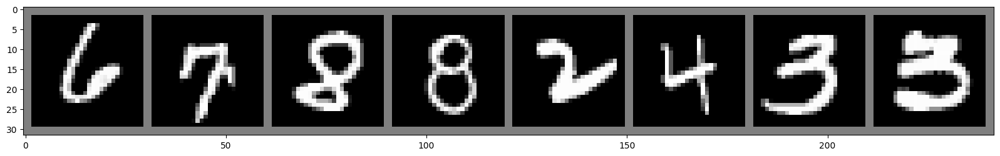

6     7     8     8     2     4     3     3    


In [5]:
def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.figure(figsize=[20, 20])
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()

dataiter = iter(trainloader)
images, labels = next(dataiter)

images = images[:8]
labels = labels[:8]

imshow(torchvision.utils.make_grid(images))
print(' '.join(f'{classes_by_index[labels[j]]:5s}' for j in range(8)))

In [6]:
sde = VPSDE(T_max=1,beta_min=0.01, beta_max=10.0)

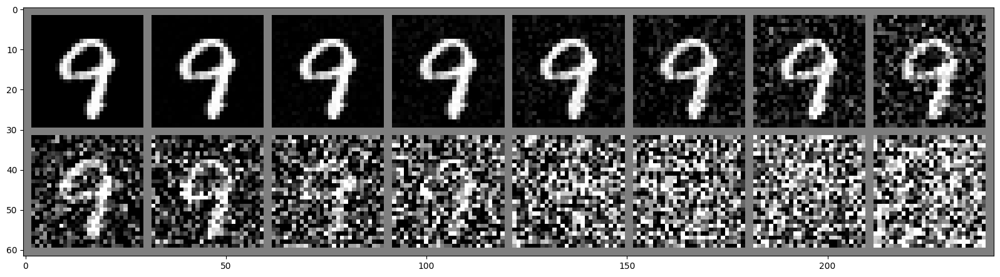

In [7]:
n_grid_points = 16
time_vec = torch.linspace(0, 1, n_grid_points)**2
X_0 = torch.stack([trainset.__getitem__(23420)[0].unsqueeze(0).squeeze()]*n_grid_points)
X_t, noise, score = sde.run_forward(X_0, torch.linspace(0, 1.0, n_grid_points)**2)
imshow(torchvision.utils.make_grid(X_t.unsqueeze(1)))

In [8]:
TRAIN_SCORE = False #whether to train score or denoiser network

In [9]:
import torch
import torch.nn as nn
import torch.nn.functional as F

In [10]:
class ChannelShuffle(nn.Module):
    def __init__(self, groups):
        super().__init__()
        self.groups = groups
    
    def forward(self, x):
        n,c,h,w=x.shape
        x=x.view(n,self.groups,c//self.groups,h,w) # group
        x=x.transpose(1,2).contiguous().view(n,-1,h,w) #shuffle
        
        return x

class ConvBnSiLu(nn.Module):
    def __init__(self,in_channels,out_channels,kernel_size,stride=1,padding=0):
        super().__init__()
        self.module=nn.Sequential(nn.Conv2d(in_channels,out_channels,kernel_size,stride=stride,padding=padding),
                                  nn.BatchNorm2d(out_channels),
                                  nn.SiLU(inplace=True))
    def forward(self,x):
        return self.module(x)

class ResidualBottleneck(nn.Module):
    '''
    shufflenet_v2 basic unit
    '''
    def __init__(self,in_channels,out_channels):
        super().__init__()

        self.branch1=nn.Sequential(nn.Conv2d(in_channels//2,in_channels//2,3,1,1,groups=in_channels//2),
                                    nn.BatchNorm2d(in_channels//2),
                                    ConvBnSiLu(in_channels//2,out_channels//2,1,1,0))
        self.branch2=nn.Sequential(ConvBnSiLu(in_channels//2,in_channels//2,1,1,0),
                                    nn.Conv2d(in_channels//2,in_channels//2,3,1,1,groups=in_channels//2),
                                    nn.BatchNorm2d(in_channels//2),
                                    ConvBnSiLu(in_channels//2,out_channels//2,1,1,0))
        self.channel_shuffle=ChannelShuffle(2)

    def forward(self,x):
        x1,x2=x.chunk(2,dim=1)
        x=torch.cat([self.branch1(x1),self.branch2(x2)],dim=1)
        x=self.channel_shuffle(x) #shuffle two branches

        return x

class ResidualDownsample(nn.Module):
    '''
    shufflenet_v2 downsample unit
    '''
    def __init__(self,in_channels,out_channels):
        super().__init__()
        self.branch1=nn.Sequential(nn.Conv2d(in_channels,in_channels,3,2,1,groups=in_channels),
                                    nn.BatchNorm2d(in_channels),
                                    ConvBnSiLu(in_channels,out_channels//2,1,1,0))
        self.branch2=nn.Sequential(ConvBnSiLu(in_channels,out_channels//2,1,1,0),
                                    nn.Conv2d(out_channels//2,out_channels//2,3,2,1,groups=out_channels//2),
                                    nn.BatchNorm2d(out_channels//2),
                                    ConvBnSiLu(out_channels//2,out_channels//2,1,1,0))
        self.channel_shuffle=ChannelShuffle(2)

    def forward(self,x):
        x=torch.cat([self.branch1(x),self.branch2(x)],dim=1)
        x=self.channel_shuffle(x) #shuffle two branches

        return x

class TimeMLP(nn.Module):
    '''
    naive introduce timestep information to feature maps with mlp and add shortcut    
    '''
    def __init__(self, embedding_dim, hidden_dim, out_dim):
        super().__init__()
        self.mlp = nn.Sequential(nn.Linear(embedding_dim,hidden_dim),
                                nn.SiLU(),
                               nn.Linear(hidden_dim,out_dim))
        self.act=nn.SiLU()
    def forward(self,x,t):
        t_emb=self.mlp(t).unsqueeze(-1).unsqueeze(-1)
        x=x+t_emb
  
        return self.act(x)

class EncoderBlock(nn.Module):
    def __init__(self,in_channels,out_channels,time_embedding_dim):
        super().__init__()
        self.conv0=nn.Sequential(*[ResidualBottleneck(in_channels,in_channels) for i in range(3)],
                                    ResidualBottleneck(in_channels,out_channels//2))

        self.time_mlp=TimeMLP(embedding_dim=time_embedding_dim,hidden_dim=out_channels,out_dim=out_channels//2)
        self.conv1=ResidualDownsample(out_channels//2,out_channels)
    
    def forward(self,x,t=None):
        x_shortcut=self.conv0(x)
        if t is not None:
            x=self.time_mlp(x_shortcut,t)
        x=self.conv1(x)

        return [x,x_shortcut]

class DecoderBlock(nn.Module):
    def __init__(self,in_channels,out_channels,time_embedding_dim):
        super().__init__()
        self.upsample=nn.Upsample(scale_factor=2,mode='bilinear',align_corners=False)
        self.conv0=nn.Sequential(*[ResidualBottleneck(in_channels,in_channels) for i in range(3)],
                                    ResidualBottleneck(in_channels,in_channels//2))

        self.time_mlp=TimeMLP(embedding_dim=time_embedding_dim,hidden_dim=in_channels,out_dim=in_channels//2)
        self.conv1=ResidualBottleneck(in_channels//2,out_channels//2)

    def forward(self,x,x_shortcut,t=None):
        x=self.upsample(x)
        x=torch.cat([x,x_shortcut],dim=1)
        x=self.conv0(x)
        if t is not None:
            x=self.time_mlp(x,t)
        x=self.conv1(x)

        return x        

class Unet(nn.Module):
    '''
    simple unet design without attention
    '''
    def __init__(self,timesteps,time_embedding_dim,in_channels=3,out_channels=2,base_dim=32,dim_mults=[2,4,8,16], temp: float = 20.0):
        super().__init__()
        assert isinstance(dim_mults,(list,tuple))
        assert base_dim%2==0 

        channels=self._cal_channels(base_dim,dim_mults)

        self.init_conv=ConvBnSiLu(in_channels,base_dim,3,1,1)
        #self.time_embedding=nn.Embedding(timesteps,time_embedding_dim)
        self.time_embedding=nn.Linear(timesteps,time_embedding_dim)

        self.encoder_blocks=nn.ModuleList([EncoderBlock(c[0],c[1],time_embedding_dim) for c in channels])
        self.decoder_blocks=nn.ModuleList([DecoderBlock(c[1],c[0],time_embedding_dim) for c in channels[::-1]])
    
        self.mid_block=nn.Sequential(*[ResidualBottleneck(channels[-1][1],channels[-1][1]) for i in range(2)],
                                        ResidualBottleneck(channels[-1][1],channels[-1][1]//2))

        self.final_conv=nn.Conv2d(in_channels=channels[0][0]//2,out_channels=out_channels,kernel_size=1)

        self.centers = nn.Parameter(torch.linspace(0,1,timesteps+1)[:-1]+0.5/timesteps,requires_grad=False)
        self.temp = temp
        

    def get_softmax(self, t):
        softmax_mat = F.softmax(-self.temp*torch.abs(t[:,None]-self.centers[None,:]), dim=1)
        return softmax_mat
        
    def get_time_emb(self,t):
        softmax_mat = self.get_softmax(t)
        t=self.time_embedding(softmax_mat)
    
        return t
        
    def forward(self,x,t=None):
        
        x=self.init_conv(x)
        
        if t is not None:
            t = self.get_time_emb(t)
            
        encoder_shortcuts=[]
        for encoder_block in self.encoder_blocks:
            x,x_shortcut=encoder_block(x,t)
            encoder_shortcuts.append(x_shortcut)
        x=self.mid_block(x)
        encoder_shortcuts.reverse()
        for decoder_block,shortcut in zip(self.decoder_blocks,encoder_shortcuts):
            x=decoder_block(x,shortcut,t)
        x=self.final_conv(x)

        return x

    def _cal_channels(self,base_dim,dim_mults):
        dims=[base_dim*x for x in dim_mults]
        dims.insert(0,base_dim)
        channels=[]
        for i in range(len(dims)-1):
            channels.append((dims[i],dims[i+1])) # in_channel, out_channel

        return channels


In [11]:
N_TIMESTEPS = 100
n_channels = 1

model = Unet(base_dim=image_size, in_channels=n_channels, out_channels=n_channels, time_embedding_dim=256, timesteps=N_TIMESTEPS, dim_mults=[2, 4], temp=100.0)
model = torch.compile(model)

In [12]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [21]:
LEARNING_RATE = 1e-2 #2e-5
WEIGHT_DECAY = 0.0
N_EPOCHS = 100
RETRAIN = True

if RETRAIN:
    optimizer = torch.optim.AdamW(model.parameters(),lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY,maximize=False)
    scheduler=torch.optim.lr_scheduler.OneCycleLR(optimizer,LEARNING_RATE,total_steps=N_EPOCHS*len(trainloader),pct_start=0.25,anneal_strategy='cos')
    
    model,running_loss_list = train_diffusion_model(model, sde, trainloader, train_score=TRAIN_SCORE, optimizer=optimizer, scheduler=scheduler, device=device, n_epochs=N_EPOCHS, print_every=100)
    torch.save(model.state_dict(),"20231120_mnist_diffusion_denoiser.ckpt")
    
else:
    model_state_dict = torch.load("20231120_mnist_diffusion_denoiser.ckpt")
    model.load_state_dict(model_state_dict)

Epoch: 0


/usr/local/lib/python3.12/dist-packages/torch/backends/cuda/__init__.py:131: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  return torch._C._get_cublas_allow_tf32()
W0122 11:50:03.338000 748 torch/_inductor/utils.py:1558] [0/0] Not enough SMs to use max_autotune_gemm mode


0.859889407157898
0.46786140024662015
0.28826397478580473
0.19701575756072998
Epoch: 1
0.1284378720074892
0.1104957915097475
0.09740723632276058
0.08612129248678685
Epoch: 2
0.07714558310806752
0.07140337776392698
0.06621434584259987
0.06486608900129795
Epoch: 3
0.05990214791148901
0.05858846105635166
0.056851212829351426
0.05468656990677118
Epoch: 4
0.05229780580848455
0.0511079241335392
0.04921837218105793
0.04880502533167601
Epoch: 5
0.046908218041062356
0.04479500085115433
0.045196738466620444
0.045739682167768476
Epoch: 6
0.04350689839571714
0.04454908110201359
0.04298696294426918
0.043557009175419804
Epoch: 7
0.041191996932029726
0.04155226849019528
0.041990675292909146
0.04169471982866526
Epoch: 8
0.04022954147309065
0.04099796231836081
0.040337992310523985
0.041749187745153904
Epoch: 9
0.03907459976151586
0.04050673054531217
0.040845872983336445
0.04024470927193761
Epoch: 10
0.04058606937527656
0.03852721152827144
0.038179529886692765
0.04005297861993313
Epoch: 11
0.03837419748

In [31]:
torch._dynamo.config.suppress_errors = True #You might need to add that line for it to work
model = model.to(device)
x_start = torch.clip(torch.randn(size=next(iter(trainloader))[0].shape)[:64],-1.0,1.0)
output,time_grid = run_backwards(model,sde,x_start=x_start,n_steps=1000,device=device,train_score=TRAIN_SCORE, clip_min=-10.0, clip_max=10.0)

0it [00:00, ?it/s]

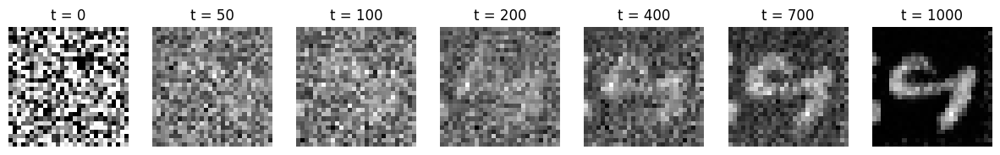

In [ ]:
def imshow(img):
    #img = (img + 1)/2
    npimg = img.numpy()
    plt.figure(figsize=[20, 20])
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    #plt.show()

print(output.shape)
imshow(torchvision.utils.make_grid(output[:,-1]))

In [27]:
from PIL import Image
def make_gif():
    n_images = 20
    time_jumps = output.shape[1]//n_images
    idx_list = [i * time_jumps for i in range(n_images)] + [output.shape[1]-1]
    image_paths = []
    for idx in idx_list:
        imshow(torchvision.utils.make_grid(output[:,idx]))
        filepath = f"mnist_gen_idx={idx}.png"
        plt.savefig(filepath)
        image_paths.append(filepath)
    
    frames = [Image.open(image) for image in image_paths+[image_paths[-1]]*min(len(image_paths),15)]
    frame_one = frames[0]
    frame_one.save("MNIST_diffusion.gif", format="GIF", append_images=frames,
               save_all=True, duration=100, loop=0)
    for image_path in image_paths:
       os.remove(image_path)

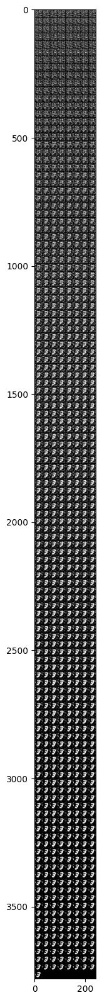

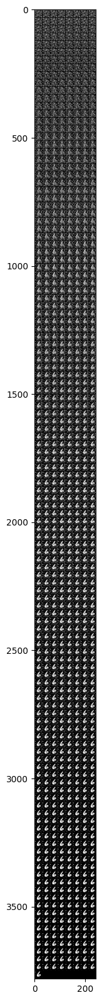

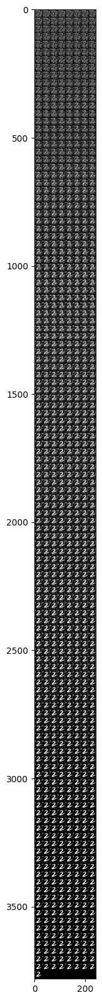

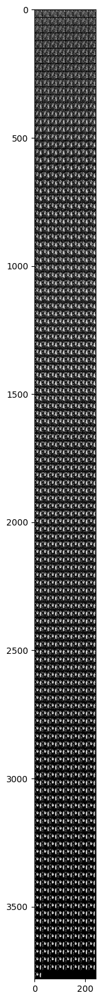

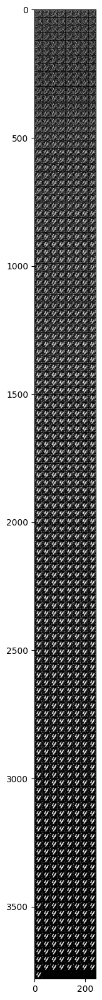

...

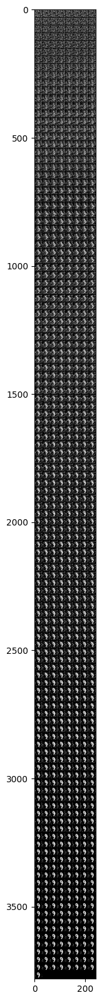

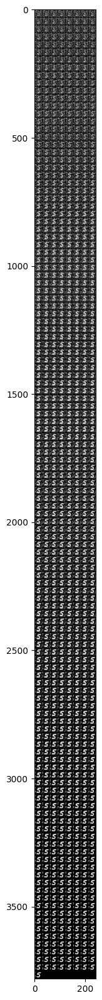

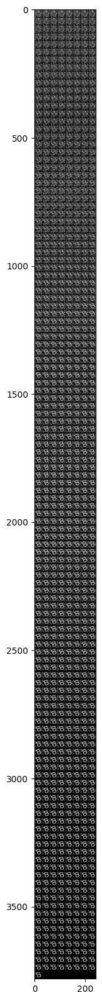

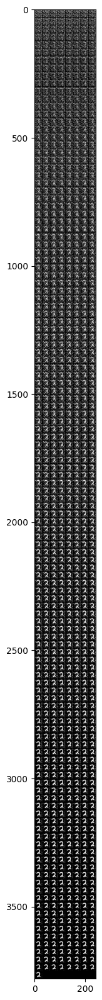

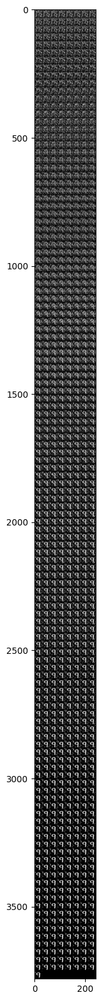

In [28]:
from IPython.display import clear_output
make_gif()
clear_output()
from IPython.display import HTML
HTML('<img  src="/assets/animation/MNIST_diffusion.gif"">')

Now time for classifier guided basically if we have a image which class does it belongs to, yea that's it.

In [ ]:
import torch.nn.functional as F
from torch.optim.lr_scheduler import LRScheduler

In [ ]:
image_size = 28
classes_by_index  = np.arange(0,10).astype('str')

transform = transforms.Compose([transforms.Resize(image_size),\
                                transforms.ToTensor(),\
                                transforms.Normalize([0.5],[0.5])]) #Normalize to -1,1
trainset = torchvision.datasets.MNIST(root='./data', train=True,
                                    download=True, transform=transform)
testset = torchvision.datasets.MNIST(root='./data', train=False,
                                    download=True, transform=transform)

batch_size = 256
trainloader = torch.utils.data.DataLoader(trainset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)
testloader = torch.utils.data.DataLoader(testset, batch_size=batch_size,
                                          shuffle=True, num_workers=2)

In [ ]:
class MNISTClassifier(nn.Module):
    def __init__(self):
        super(MNISTClassifier, self).__init__()
        self.conv1 = nn.Conv2d(1, 10, kernel_size=5)
        self.conv2 = nn.Conv2d(10, 20, kernel_size=5)
        self.conv2_drop = nn.Dropout2d()
        self.fc1 = nn.Linear(320, 50)
        self.fc2 = nn.Linear(50, 10)

    def forward(self, x, t):
        x = F.relu(F.max_pool2d(self.conv1(x), 2))
        x = F.relu(F.max_pool2d(self.conv2_drop(self.conv2(x)), 2))
        x = x.view(-1, 320)
        x = F.relu(x + t[:,None])
        x = F.relu(self.fc1(x))
        x = F.dropout(x, training=self.training)
        x = self.fc2(x)
        return F.log_softmax(x)

In [ ]:
def train_diffused_classifier(model, sde: ItoSDE, dataloader: DataLoader, optimizer, device, n_epochs: int, print_every: int, scheduler: LRScheduler = None):
    
    model.train()
    model = model.to(DEVICE)
    running_loss_list = []
    lr_list = []
    
    for epoch in range(n_epochs):
        print(f"Epoch: {epoch}")
        running_loss = 0.0
        for idx, (x_inp,target) in tqdm(enumerate(dataloader), total=len(dataloader)):
            
            #Zero gradients:
            optimizer.zero_grad()
            
            #Run forward samples:
            X_t,noise,score,time = sde.run_forward_random_times(x_inp)

            #Send to device:
            X_t = X_t.to(DEVICE)
            noise = noise.to(DEVICE)
            time = time.to(DEVICE)
            
            #Predict score:
            model_pred = model(X_t,time)

            #ONLY THIS LINE CHANGED TO BEFORE: we train the model to minimize the negative log-likelihood:
            loss = F.nll_loss(model_pred, target.to(DEVICE))

            #Optimize:
            loss.backward()
            optimizer.step()

            if scheduler is not None:
                scheduler.step()
                
            # print statistics
            running_loss += loss.detach().item()
            
            if (idx+1) % print_every == 0:
                avg_loss = running_loss/print_every
                running_loss_list.append(avg_loss)
                running_loss = 0.0
                if scheduler is not None:
                    print(f"Loss: {avg_loss:.4f} | {scheduler.get_lr()}")
                    lr_list.append(scheduler.get_lr())
                else:
                    print(f"Loss: {avg_loss:.4f}")

                
    return model,running_loss_list

In [ ]:
LEARNING_RATE = 1e-3 #2e-5
WEIGHT_DECAY = 0.0
N_EPOCHS = 500
TRAIN_SCORE = False
RETRAIN = False
classifier = MNISTClassifier()

if RETRAIN:
    optimizer = torch.optim.AdamW(classifier.parameters(),lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY,maximize=False)
    scheduler=torch.optim.lr_scheduler.OneCycleLR(optimizer,LEARNING_RATE,total_steps=N_EPOCHS*len(trainloader),pct_start=0.25,anneal_strategy='cos')
    classifier,running_loss_list = train_diffused_classifier(classifier, sde, trainloader, optimizer=optimizer, scheduler=scheduler, device=DEVICE, n_epochs=N_EPOCHS, print_every=100)
    torch.save(classifier.state_dict(),"20231127_mnist_diffusion_classifier.ckpt")
    
else:
    classifier_state_dict = torch.load("20231127_mnist_diffusion_classifier.ckpt")
    classifier.load_state_dict(classifier_state_dict)
    classifier = classifier.to(DEVICE)

In [ ]:
n_grid_points = 16
time_vec = torch.linspace(0,1,n_grid_points)**2
X_0, Y = trainset.__getitem__(23410)
X_0 = torch.stack([X_0.unsqueeze(0).squeeze()]*n_grid_points)
X_t, noise, score = sde.run_forward(X_0,time_vec)
X_t = X_t.unsqueeze(1)

results = np.exp(classifier(X_t.to(DEVICE),time_vec.to(DEVICE)).cpu().detach().numpy())
fig, axs = plt.subplots(2, len(results),figsize=(3*len(results),6))
for idx in range(len(results)):
    axs[0,idx].set_title(f"Prediction distribution \n time = {time_vec[idx]:.3f}")
    axs[0, idx].bar(x=classes_by_index, height=results[idx])
    axs[1, idx].set_title(f"Input image at t={time_vec[idx]:.2f}")
    axs[1, idx].imshow(X_t[idx].squeeze(), cmap='grey')